##                                    TELECOM CHURN CASE STUDY

### Objectives

- The main goal of the case study is to build ML models to predict churn. The predictive model that we’re going to build will the following purposes:

- It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

- It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

- Even though overall accuracy will be your primary evaluation metric, you should also mention other metrics like precision, recall, etc. for the different models that can be used for evaluation purposes based on different business objectives. For example, in this problem statement, one business goal can be to build an ML model that identifies customers who'll definitely churn with more accuracy as compared to the ones who'll not churn. Make sure you mention which metric can be used in such scenarios.

-  Recommend strategies to manage customer churn based on your observations.

 

### Steps to be followed: -

- 1. Data Reading and Understanding
- 2. Data Cleaning and Preprocessing 
- 3. Exploratory Data Analysis
- 4. Feature Engineering
- 5. Model Selection, Building and Prediction
- 6. Business Goals

### Step 1: DATA READING & UNDERSTANDING

In [2]:
#lets import all the required necessary libraries

import pandas as pd
import numpy as np
import re
import os


from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score

#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

#Others
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

%matplotlib inline

In [3]:
churn_df = pd.read_csv('churn_train.csv')
churn_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [4]:
unseen_df = pd.read_csv('churn_test.csv')
unseen_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [5]:
sample_df = pd.read_csv('churn_sample.csv')
sample_df.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0


In [6]:
data_dict = pd.read_csv('churn_data_dictionary.csv')
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belo...
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile...
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [7]:
# lets see size of all the dataframes we have
print(churn_df.shape)
print(unseen_df.shape)
print(sample_df.shape)
print(data_dict.shape)

(69999, 172)
(30000, 171)
(30000, 2)
(36, 2)


In [8]:
# lets check details about the type of data 
churn_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [9]:
churn_df.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

In [10]:
churn_df.columns

Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability'],
      dtype='object', length=172)

### 2. DATA CLEANING & PREPROCESSING

In [11]:
# lets check the all the columns with unique values and drop such columns with its value as 1
unique_1_col=[]
for i in churn_df.columns:
    if churn_df[i].nunique() == 1:
        unique_1_col.append(i)
    else:
        pass

churn_df.drop(unique_1_col, axis=1, inplace = True)
print("\n The following Columns are dropped from the dataset as their unique value is 1. (i.e.)It has no variance in the model\n",
      unique_1_col)



 The following Columns are dropped from the dataset as their unique value is 1. (i.e.)It has no variance in the model
 ['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


In [12]:
#let's recheck how many columns now we have after dropping above columns
churn_df.shape

(69999, 159)

In [13]:
# lets drop dates columns 
dates = [i for i in list(churn_df.columns) if re.search('date',i)]
churn_df = churn_df.drop(dates, axis=1)
unseen_df = unseen_df.drop(dates,axis=1)

In [14]:
# After dropping above columns, lets Check the overall missing values in the dataset
((churn_df.isnull().sum()/churn_df.shape[0])*100).round(2).sort_values(ascending=False)

count_rech_3g_6       74.90
fb_user_6             74.90
arpu_2g_6             74.90
arpu_3g_6             74.90
night_pck_user_6      74.90
total_rech_data_6     74.90
max_rech_data_6       74.90
av_rech_amt_data_6    74.90
count_rech_2g_6       74.90
arpu_3g_7             74.48
fb_user_7             74.48
night_pck_user_7      74.48
total_rech_data_7     74.48
max_rech_data_7       74.48
count_rech_2g_7       74.48
arpu_2g_7             74.48
av_rech_amt_data_7    74.48
count_rech_3g_7       74.48
fb_user_8             73.69
arpu_2g_8             73.69
count_rech_2g_8       73.69
arpu_3g_8             73.69
count_rech_3g_8       73.69
max_rech_data_8       73.69
total_rech_data_8     73.69
night_pck_user_8      73.69
av_rech_amt_data_8    73.69
std_ic_mou_8           5.29
isd_og_mou_8           5.29
std_ic_t2f_mou_8       5.29
spl_og_mou_8           5.29
loc_ic_t2f_mou_8       5.29
loc_ic_t2t_mou_8       5.29
std_ic_t2m_mou_8       5.29
loc_ic_mou_8           5.29
og_others_8         

In [15]:
churn_df=churn_df.loc[:,churn_df.isnull().sum()/churn_df.shape[0]*100<30]

In [16]:
churn_df.shape

(69999, 126)

In [17]:
# Lets derive few new columns from the given columns

columns_to_drop = [
    'vol_2g_mb_8', 'vol_2g_mb_6', 'vol_2g_mb_7',
    'vol_3g_mb_8'  , 'vol_3g_mb_6', 'vol_3g_mb_7' ,
    'total_og_mou_8','total_og_mou_6', 'total_og_mou_7', 
    'total_ic_mou_8','total_ic_mou_6', 'total_ic_mou_7',
    'aug_vbc_3g','jul_vbc_3g','jun_vbc_3g',
    'arpu_8','arpu_6','arpu_7',
    'total_rech_amt_8', 'total_rech_amt_6', 'total_rech_amt_7']

churn_df['delta_vol_2g'] = churn_df['vol_2g_mb_8'] - churn_df['vol_2g_mb_6'].add(churn_df['vol_2g_mb_7']).div(2)
churn_df['delta_vol_3g'] = churn_df['vol_3g_mb_8'] - churn_df['vol_3g_mb_6'].add(churn_df['vol_3g_mb_7']).div(2)
churn_df['delta_total_og_mou'] = churn_df['total_og_mou_8'] - churn_df['total_og_mou_6'].add(churn_df['total_og_mou_7']).div(2)
churn_df['delta_total_ic_mou'] = churn_df['total_ic_mou_8'] - churn_df['total_ic_mou_6'].add(churn_df['total_ic_mou_7']).div(2)
churn_df['delta_vbc_3g'] = churn_df['aug_vbc_3g'] - churn_df['jun_vbc_3g'].add(churn_df['jul_vbc_3g']).div(2)
churn_df['delta_arpu'] = churn_df['arpu_8'] - churn_df['arpu_6'].add(churn_df['arpu_7']).div(2)
churn_df['delta_total_rech_amt'] = churn_df['total_rech_amt_8'] - churn_df['total_rech_amt_6'].add(churn_df['total_rech_amt_7']).div(2)



# Removing variables used for derivation : 
churn_df.drop(columns=columns_to_drop, inplace=True)


In [18]:
unseen_df['delta_vol_2g'] = unseen_df['vol_2g_mb_8'] - unseen_df['vol_2g_mb_6'].add(unseen_df['vol_2g_mb_7']).div(2)
unseen_df['delta_vol_3g'] = unseen_df['vol_3g_mb_8'] - unseen_df['vol_3g_mb_6'].add(unseen_df['vol_3g_mb_7']).div(2)
unseen_df['delta_total_og_mou'] = unseen_df['total_og_mou_8'] - unseen_df['total_og_mou_6'].add(unseen_df['total_og_mou_7']).div(2)
unseen_df['delta_total_ic_mou'] = unseen_df['total_ic_mou_8'] - unseen_df['total_ic_mou_6'].add(unseen_df['total_ic_mou_7']).div(2)
unseen_df['delta_vbc_3g'] = unseen_df['aug_vbc_3g'] - unseen_df['jun_vbc_3g'].add(unseen_df['jul_vbc_3g']).div(2)
unseen_df['delta_arpu'] = unseen_df['arpu_8'] - unseen_df['arpu_6'].add(unseen_df['arpu_7']).div(2)
unseen_df['delta_total_rech_amt'] = unseen_df['total_rech_amt_8'] - unseen_df['total_rech_amt_6'].add(unseen_df['total_rech_amt_7']).div(2)

# Removing variables used for derivation : 
unseen_df.drop(columns=columns_to_drop, inplace=True)

In [19]:
#lets recheck whether the above operations are appplied successfully or not
churn_df.head()

,id,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,delta_vol_2g,delta_vol_3g,delta_total_og_mou,delta_total_ic_mou,delta_vbc_3g,delta_arpu,delta_total_rech_amt
0,0,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,0.000,0.00,-147.815,8.120,0.0,-51.6160,-61.0
1,1,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,-176.455,-1.98,16.295,3.600,0.0,-18.4405,-22.5
2,2,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,0.000,0.00,-77.925,-42.420,0.0,-81.9910,-95.0
3,3,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,8.89,0.28,2.81,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,0,0.000,0.00,-32.165,11.195,0.0,-69.7160,-70.0
4,4,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,6.13,36.74,19.88,4.61,11.99,1.23,5.01,0.00,9.85,0.00,58.91,25.94,15.76,0.00,0.00,0.00,4.35,0.00,0.0,0.00,0.0,0.0,4.35,0.00,0.00,0.0,0.0,0.0,0.00,17.00,0.00,0.00,0.0,0.0,5.44,1.39,2.66,10.58,4.33,19.49,5.51,3.63,6.14,21.54,9.36,28.31,0.00,0.0

In [20]:
unseen_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,delta_vol_2g,delta_vol_3g,delta_total_og_mou,delta_total_ic_mou,delta_vbc_3g,delta_arpu,delta_total_rech_amt
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,50,30,30,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.0,0.0,-14.225,-6.385,0.000,-14.1610,-36.5
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,250,250,250,250,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,2533,0.0,0.0,-190.870,-36.325,0.000,-104.0000,0.0
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.

In [21]:
#confirming the conversion of dtype
churn_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 112 columns):
 #    Column                Dtype  
---   ------                -----  
 0    id                    int64  
 1    onnet_mou_6           float64
 2    onnet_mou_7           float64
 3    onnet_mou_8           float64
 4    offnet_mou_6          float64
 5    offnet_mou_7          float64
 6    offnet_mou_8          float64
 7    roam_ic_mou_6         float64
 8    roam_ic_mou_7         float64
 9    roam_ic_mou_8         float64
 10   roam_og_mou_6         float64
 11   roam_og_mou_7         float64
 12   roam_og_mou_8         float64
 13   loc_og_t2t_mou_6      float64
 14   loc_og_t2t_mou_7      float64
 15   loc_og_t2t_mou_8      float64
 16   loc_og_t2m_mou_6      float64
 17   loc_og_t2m_mou_7      float64
 18   loc_og_t2m_mou_8      float64
 19   loc_og_t2f_mou_6      float64
 20   loc_og_t2f_mou_7      float64
 21   loc_og_t2f_mou_8      float64
 22   loc_og_t2c_mou_6    

In [22]:
churn_df.shape

(69999, 112)

**missing value treatment**

- lets impute missing values with zeroes using KNN Imputer

In [23]:
import pandas as pd
from sklearn.impute import KNNImputer

churn_df.fillna(0, inplace=True)

# Extract numerical columns (you can modify this based on your actual column types)
numerical_columns = churn_df.select_dtypes(include=['float64', 'int64']).columns

# Create a copy of the DataFrame for imputation
churn_imputed = churn_df.copy()

# Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=45)  # You can adjust the number of neighbors

# Fit and transform the numerical columns using KNNImputer
churn_imputed[numerical_columns] = knn_imputer.fit_transform(churn_imputed[numerical_columns])

# Check for missing values after imputation
missing_values = churn_imputed.isnull().sum().sum()

if missing_values == 0:
    print("There are no missing values in the Churn DataFrame after imputation.")
else:
    print(f"There are still {missing_values} missing values in the DataFrame after imputation.")


There are no missing values in the Churn DataFrame after imputation.


In [24]:
unseen_df.fillna(0, inplace=True)

# Extract numerical columns (you can modify this based on your actual column types)
numerical_columns = unseen_df.select_dtypes(include=['float64', 'int64']).columns

# Create a copy of the DataFrame for imputation
unseen_imputed = unseen_df.copy()

# Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=45)  # You can adjust the number of neighbors

# Fit and transform the numerical columns using KNNImputer
unseen_imputed[numerical_columns] = knn_imputer.fit_transform(unseen_imputed[numerical_columns])

# Check for missing values after imputation
missing_values = unseen_imputed.isnull().sum().sum()

if missing_values == 0:
    print("There are no missing values in the Unseen DataFrame after imputation.")
else:
    print(f"There are still {missing_values} missing values in the Unseen DataFrame after imputation.")


There are no missing values in the Unseen DataFrame after imputation.


<Axes: >

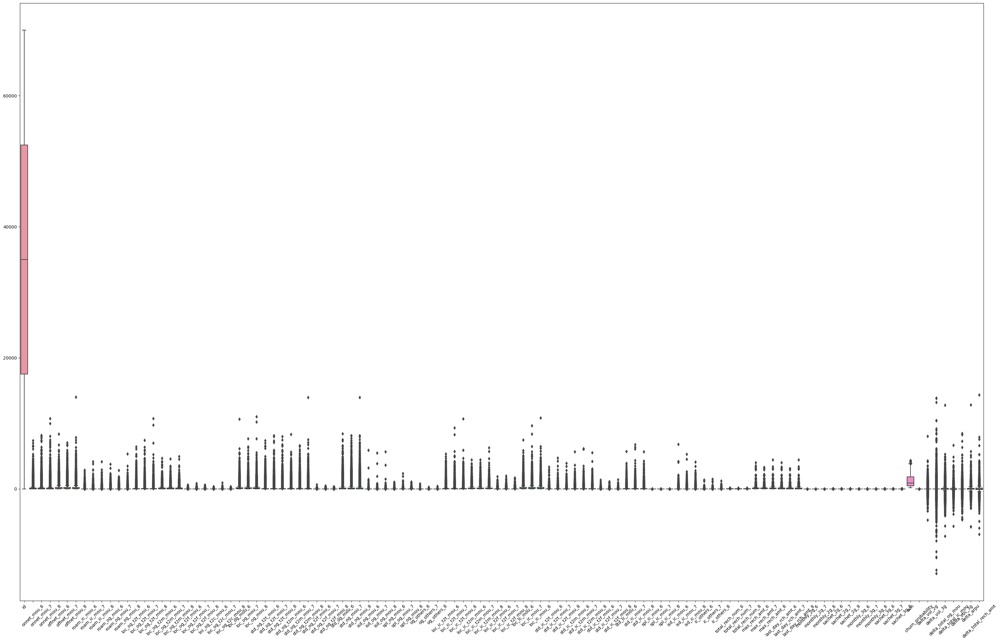

In [25]:
#missing values treated successfully, now we need to look for outliers

plt.figure(figsize=(40,25))
plt.xticks(rotation=45)
sns.boxplot(data = churn_imputed)

In [26]:
def trim_outliers(array, num_std=3):
    upper_limit = array.mean() + num_std*array.std()
    lower_limit = array.mean() - num_std*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [27]:
exclusion_list = ['churn_probability']
predictor_cols = list(set(churn_imputed.columns) - set(exclusion_list))
churn_imputed.loc[:,predictor_cols] = churn_imputed[predictor_cols].apply(trim_outliers, axis=0)
unseen_imputed.loc[:,predictor_cols] = unseen_imputed[predictor_cols].apply(trim_outliers, axis=0)
churn_imputed.describe()

,id,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,delta_vol_2g,delta_vol_3g,delta_total_og_mou,delta_total_ic_mou,delta_vbc_3g,delta_arpu,delta_total_rech_amt
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,34999.000000,114.679078,115.167348,112.473097,178.635027,177.085695,174.114240,6.803859,4.625061,4.543311,10.245548,6.729898,6.692217,38.603161,37.897628,37.258621,83.419691,81.423258,80.563606,3.027500,3.057599,2.907660,0.872936,1.077316,1.089767,128.431107,125.832884,124.017823,65.431832,68.229595,66.647128,72.491359,75.477070,73.836586,0.754435,0.715603,0.676650,147.209299,153.203539,149.589469,0.425270,0.416577,0.395919,3.292547,4.194875,4.157952,0.397330,0.006183,0.008281,40.335956,40.228404,39.274475,96.657384,96.267831,96.488171,9.860657,10.230541,9.455458,151.301654,151.131017,149.433275,7.298909,7.641676,7.454524,16.677241,17.489062,16.792453,1.504361,1.529005,1.451040,26.624446,27.867357,26.865000,0.056577,0.026611,0.033253,4.903577,5.330411,5.352176,0.557769,0.647157,0.600563,7.361597,7.501182,7.020174,100.231920,99.678927,103.322418,60.055468,55.990241,59.139173,0.

- - above figure is now treated with outliers by capping, we can ignore 1st column as it has each unique value, i.e 'id' of customer

In [28]:
churn_imputed['tenure'] = (churn_imputed['aon']/30).round(0)

In [29]:
churn_imputed['tenure'] = round((churn_imputed['aon']/30),0)

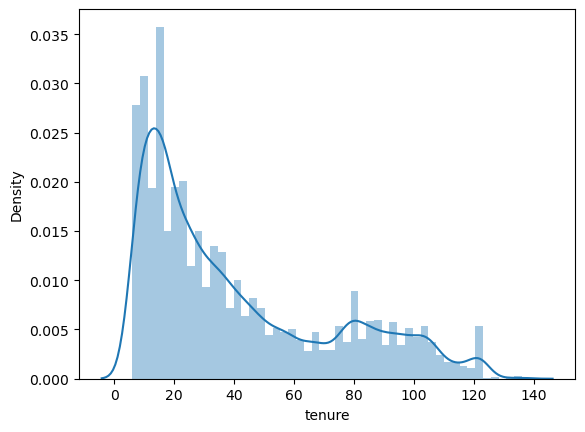

In [30]:
sns.distplot(churn_imputed['tenure'],bins=50)
plt.show()

### EXPLORATORY DATA ANALYSIS

#### Univariate Analysis

In [31]:
ten_range = [0, 6, 12, 24, 60, 61]
ten_label = ['0-6 Months', '6-12 Months', '1-2 Yrs', '2-5 Yrs', '5 Yrs and above']
churn_imputed['tenure_range'] = pd.cut(churn_imputed['tenure'], ten_range, labels=ten_label)
churn_imputed['tenure_range'].head()

0        NaN
1    1-2 Yrs
2    2-5 Yrs
3    2-5 Yrs
4    1-2 Yrs
Name: tenure_range, dtype: category
Categories (5, object): ['0-6 Months' < '6-12 Months' < '1-2 Yrs' < '2-5 Yrs' < '5 Yrs and above']

In [32]:
churn_imputed['churn_probability'].info

<bound method Series.info of 0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
5        0.0
6        0.0
7        0.0
8        1.0
9        0.0
10       0.0
11       0.0
12       0.0
13       0.0
14       0.0
15       0.0
16       0.0
17       0.0
18       0.0
19       0.0
20       0.0
21       0.0
22       0.0
23       0.0
24       0.0
25       0.0
26       0.0
27       0.0
28       0.0
29       0.0
30       0.0
31       1.0
32       0.0
33       1.0
34       0.0
35       0.0
36       0.0
37       0.0
38       0.0
39       0.0
40       0.0
41       1.0
42       0.0
43       0.0
44       0.0
45       0.0
46       0.0
47       0.0
48       0.0
49       0.0
50       0.0
51       0.0
52       0.0
53       0.0
54       0.0
55       1.0
56       0.0
57       0.0
58       0.0
59       1.0
60       0.0
61       0.0
62       0.0
63       0.0
64       1.0
65       0.0
66       0.0
67       0.0
68       0.0
69       0.0
70       0.0
71       0.0
72       0.0
73       0.0
74       

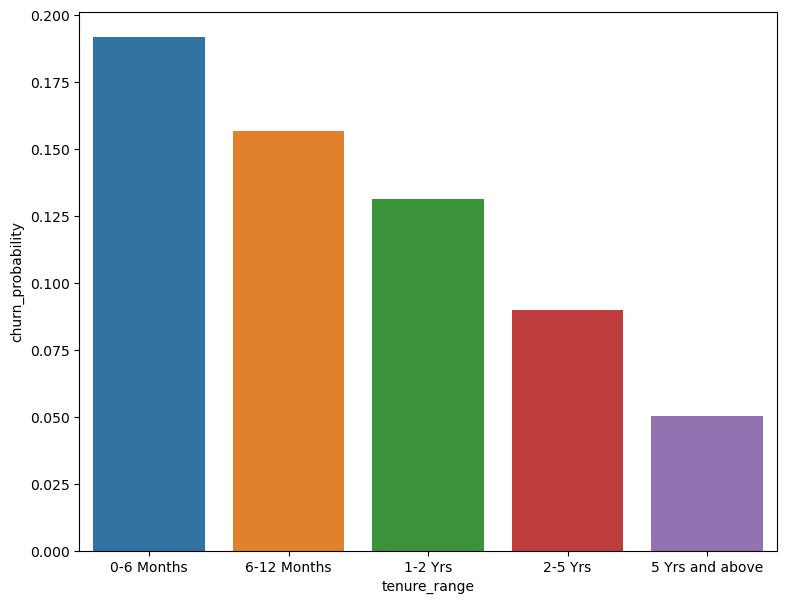

In [33]:
# Lets plot a bar graph for tenure
plt.figure(figsize=[9,7])
sns.barplot(x='tenure_range', y=churn_imputed['churn_probability'], data=churn_imputed, ci=None)
plt.show()

In [34]:
pip install tabulate

Note: you may need to restart the kernel to use updated packages.


In [35]:
#drop newly created columns tenure and tenure range as these were only used for analysis purpose
churn_imputed.drop(['tenure','tenure_range'],axis=1, inplace=True)


In [36]:
#lets again check how many columns we have now
churn_imputed.shape

(69999, 112)

In [37]:
# Column list with id and target variable

col_list=churn_imputed.columns.to_list()

col_list.remove('churn_probability')
col_list.remove('id')

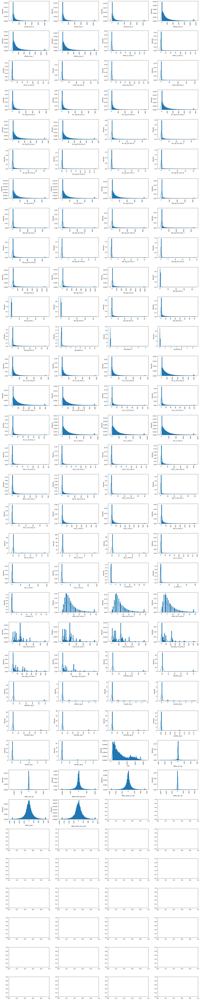

In [38]:
# Checking for distribution using distplot

fig,ax=plt.subplots(34,4,figsize=(20, 100))
for variable, subplot in zip(col_list, ax.flatten()):
    sns.distplot(churn_imputed[variable], ax=subplot,kde=True, bins=50,hist_kws={'alpha':1})
    for label in subplot.get_xticklabels():
        label.set_rotation(90)
        
plt.tight_layout()
plt.show()

#### Bivariate Analysis

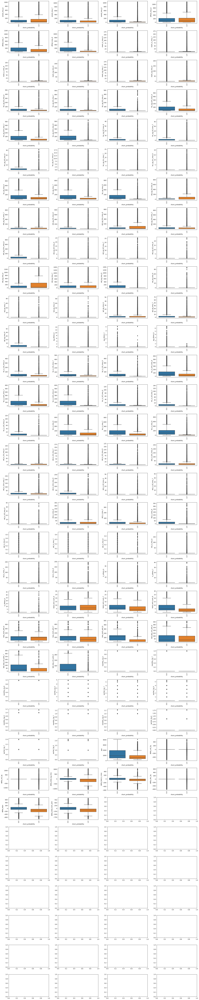

In [39]:
# Bivariate analysis of churn probability with other variables

fig, ax=plt.subplots(34,4,figsize=(20, 100))
for variable, subplot in zip(col_list,ax.flatten()):
    sns.boxplot(x='churn_probability',y=variable,data=churn_imputed,ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)
        
plt.tight_layout()
plt.show()

In [40]:
#lets check for correlation between variables 
correlation_matrix = churn_imputed.corr()

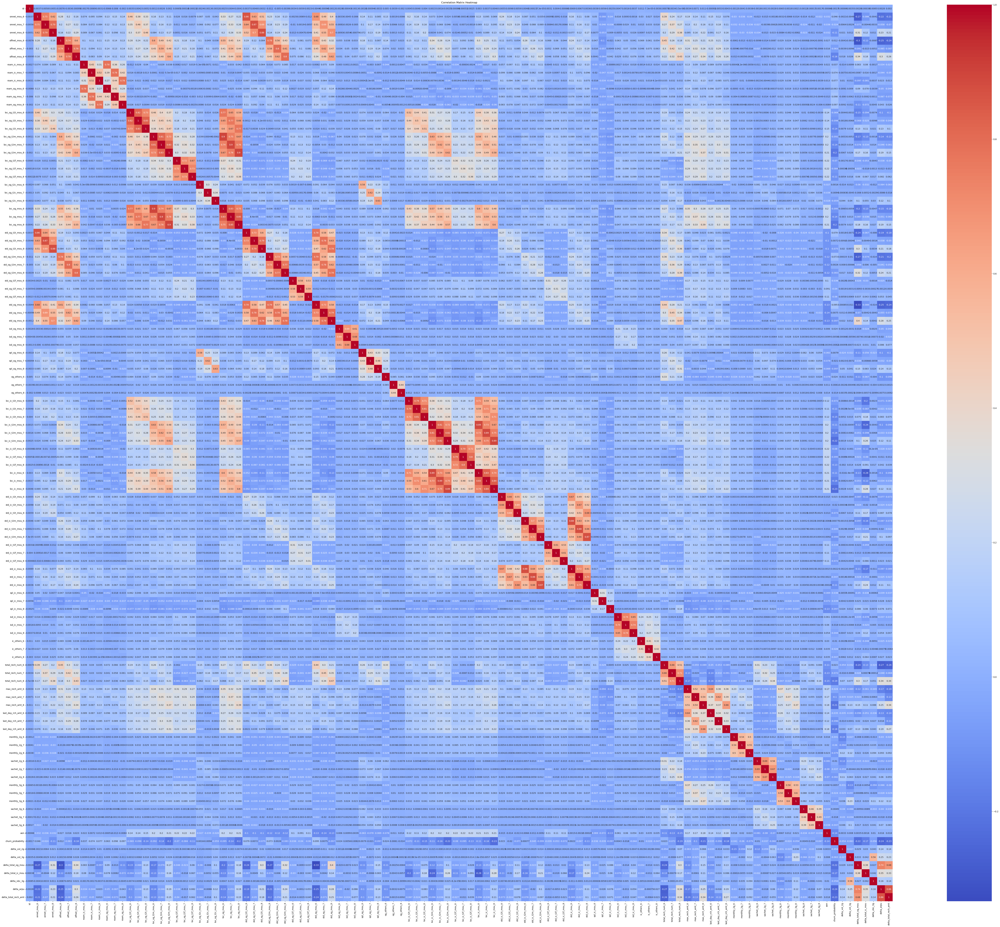

In [41]:
plt.figure(figsize=(90, 75))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

### Step 4: FEATURE ENGINEERING AND PREPROCESSING

**PreProcessing Data**

In [42]:
# before split, lets change churn_probability to numeric

churn_imputed['churn_probability']=pd.to_numeric(churn_imputed['churn_probability'])

In [43]:
X = churn_imputed.drop('churn_probability', axis=1)
y = churn_imputed['churn_probability']

# lets check the size again to know whether above operation done successfully
X.shape, y.shape

((69999, 111), (69999,))

**Train-Test Split**

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [45]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((55999, 111), (14000, 111), (55999,), (14000,))

In [46]:
#filtering out unnessesary columns from test data

unseen_imputed =  unseen_imputed[X_train.columns]
print(unseen_imputed.shape)

(30000, 111)


**Scaling**

In [47]:
scale = StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.transform(X_test)
unseen_scaled = scale.transform(unseen_imputed)

### Step 5: MODEL SELECTION, BUILDING AND PREDICTION

#### PCA for Dimentionality Reduction

In [48]:
from sklearn.decomposition import PCA 
pca = PCA(random_state = 42) 
pca.fit(X_train_scaled)

PCA(random_state=42)

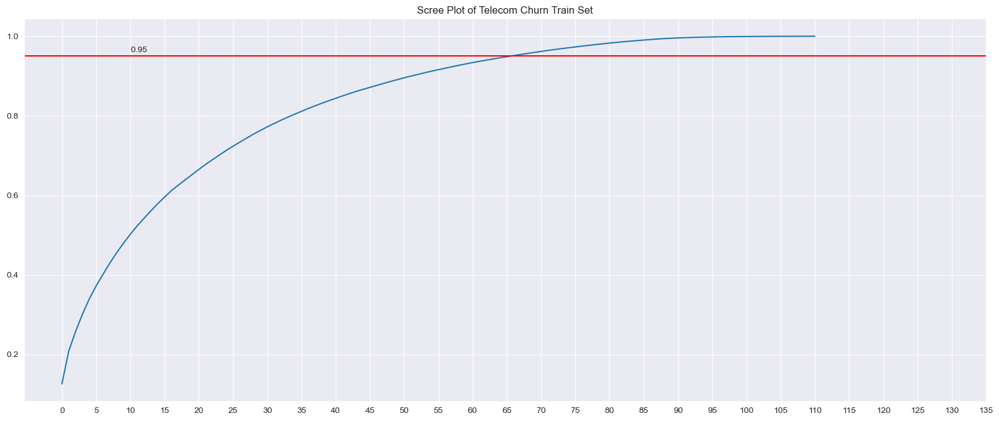

In [49]:
# Scree Plot to pick the number of components

var_cum = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(20,8))
sns.set_style('darkgrid')
sns.lineplot(var_cum)
plt.xticks(np.arange(0,140,5))
plt.axhline(0.95,color='r')
plt.text(10,0.96,'0.95')

plt.title('Scree Plot of Telecom Churn Train Set');

- Here we can clearly see that 65 Components explain 95% of the data variance.

In [50]:
pca_final = PCA(n_components=65, random_state=42)
transformed_data = pca_final.fit_transform(X_train_scaled)
X_train_pca = pd.DataFrame(transformed_data, columns=["PC_"+str(x) for x in range(1,66)], index = X_train.index)
data_train_pca = pd.concat([X_train_pca, y_train], axis=1)
X_test_pca = pd.DataFrame(pca_final.transform(X_test_scaled),columns=["PC_"+str(x) for x in range(1,66)], index = X_test.index)
unseen_pca = pd.DataFrame(pca_final.transform(unseen_scaled),columns=["PC_"+str(x) for x in range(1,66)], index = unseen_imputed.index)

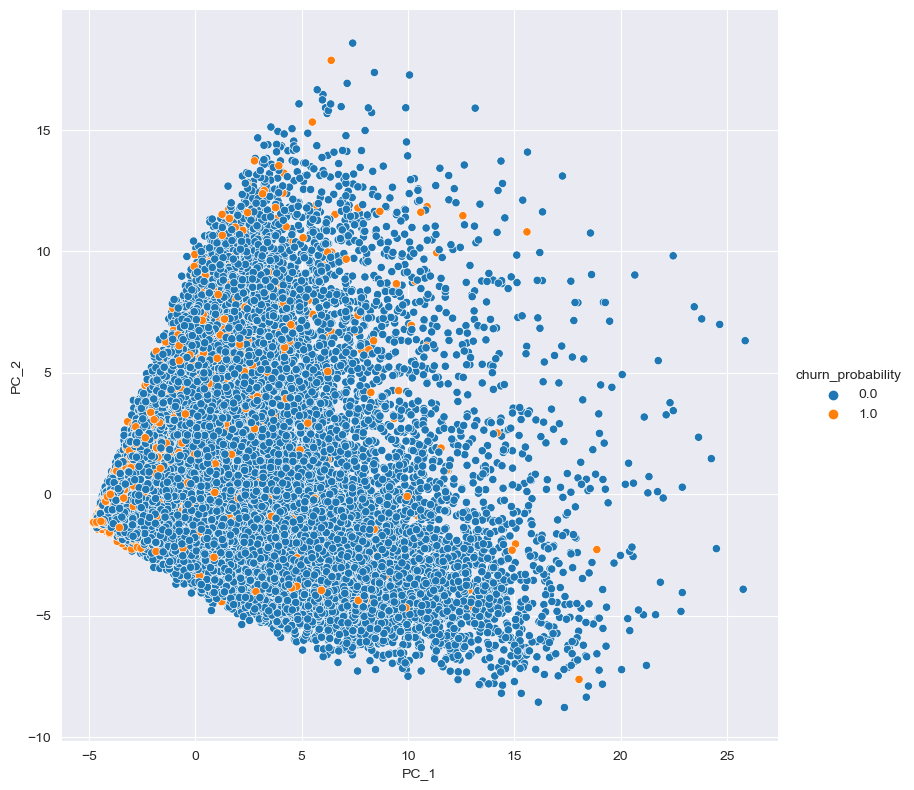

In [51]:
#Plotting principal components 

sns.pairplot(data=data_train_pca, x_vars=["PC_1"], y_vars=["PC_2"], hue = "churn_probability", size=8);

- we can clearly see the probability of non churned is much more than those who churned

#### MODEL 1: PCA WITH RANDOM FOREST

In [52]:
pca_rf = RandomForestClassifier(random_state= 42, class_weight='balanced',n_jobs=-1)

In [53]:
import time
from sklearn.model_selection import StratifiedKFold, GridSearchCV

# Record the start time
start_time = time.time()


# Hyper parameter Tuning
params = {
    'n_estimators'  : [100],
    'max_depth' : [9,10,11],
    'min_samples_leaf' : [5,10,15,20]
}
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
pca_rf_model_search = GridSearchCV(estimator=pca_rf, param_grid=params, 
                                   cv=folds, scoring='average_precision', verbose=True, n_jobs=-1 )

pca_rf_model_search.fit(X_train_pca, y_train)

end_time = time.time()

# Calculate and print the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Elapsed time: 309.7244119644165 seconds


- For imbalanced datasets, auc_roc is over- optimistic, so above is optimised for average precision

In [54]:
# Optimum Hyperparameters
print('Best Average Precision score :', pca_rf_model_search.best_score_)
print('Best Parameters :', pca_rf_model_search.best_params_)

Best Average Precision score : 0.5799785314572683
Best Parameters : {'max_depth': 11, 'min_samples_leaf': 20, 'n_estimators': 100}


In [55]:
# Modelling using the best PCA-RandomForest Estimator 
pca_rf_best = RandomForestClassifier(**pca_rf_model_search.best_params_,
                                     class_weight='balanced',
                                     random_state= 42)
pca_rf_best_fit = pca_rf_best.fit(X_train_pca, y_train)

# Prediction on Train set
y_train_pred_pca_rf_best = pca_rf_best_fit.predict(X_train_pca)
y_train_prob_pca_rf_best = pca_rf_best_fit.predict_proba(X_train_pca)
y_test_pred_pca_rf_best = pca_rf_best_fit.predict(X_test_pca)
y_test_prob_pca_rf_best = pca_rf_best_fit.predict_proba(X_test_pca)

In [56]:
from sklearn.metrics import classification_report
from sklearn.metrics import balanced_accuracy_score

best_rf_pca_report = classification_report(y_train,y_train_pred_pca_rf_best)
bal_accuracy =  balanced_accuracy_score(y_train,y_train_pred_pca_rf_best)
print('\nTraining Data:\n')
print(f'\n Accuracy Factoring In Class Imbalance: {round(bal_accuracy,2)}\n')
print(best_rf_pca_report)


Training Data:


 Accuracy Factoring In Class Imbalance: 0.89

              precision    recall  f1-score   support

         0.0       0.98      0.91      0.94     50289
         1.0       0.52      0.86      0.65      5710

    accuracy                           0.90     55999
   macro avg       0.75      0.89      0.80     55999
weighted avg       0.94      0.90      0.91     55999



In [57]:
best_rf_pca_report_test = classification_report(y_test,y_test_pred_pca_rf_best)
bal_accuracy_test =  balanced_accuracy_score(y_test,y_test_pred_pca_rf_best)
print('\nTest Data:\n')
print(f'\n Accuracy Factoring In Class Imbalance: {round(bal_accuracy_test,2)}\n')
print(best_rf_pca_report_test)


Test Data:


 Accuracy Factoring In Class Imbalance: 0.84

              precision    recall  f1-score   support

         0.0       0.97      0.90      0.94     12578
         1.0       0.47      0.78      0.59      1422

    accuracy                           0.89     14000
   macro avg       0.72      0.84      0.76     14000
weighted avg       0.92      0.89      0.90     14000



In [58]:
from sklearn.metrics import precision_recall_curve

precision_, recall_, proba = precision_recall_curve(y_train, y_train_prob_pca_rf_best[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(precision_ - recall_), proba)), key=lambda i: i[0], reverse=False)[0][1]
print(f"Optimal Probability Threshold: {optimal_proba_cutoff}\n")
roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in y_train_prob_pca_rf_best[:, -1]]
test_roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in y_test_prob_pca_rf_best[:, -1]]
print(f"Training Report After caliberation : {classification_report(y_train,roc_predictions)}\n")
print(f"Test Report After caliberation{classification_report(y_test,test_roc_predictions)}\n")

Optimal Probability Threshold: 0.6905154061742093

Training Report After caliberation :               precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     50289
         1.0       0.68      0.68      0.68      5710

    accuracy                           0.93     55999
   macro avg       0.82      0.82      0.82     55999
weighted avg       0.93      0.93      0.93     55999


Test Report After caliberation              precision    recall  f1-score   support

         0.0       0.95      0.96      0.96     12578
         1.0       0.61      0.54      0.58      1422

    accuracy                           0.92     14000
   macro avg       0.78      0.75      0.77     14000
weighted avg       0.92      0.92      0.92     14000




- Precision is a higher priority than recall for churn analysis. So we'll stick to optimal threshold of 0.690

- Accuracy score in Train data is 89% and in test data is 84%, which is pretty high

#### MODEL 2:   LOGISTIC REGRESSION WITH PCA

In [59]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
def print_metrics(y, y_pred):
   
        print("Train Set Performance")
        print("Confusion Matrix")
        print(metrics.confusion_matrix(y, y_pred))
        print("Accuracy Score : ",round(accuracy_score(y, y_pred),2))
        print("Precision Score : ", round(precision_score(y,y_pred),2))
        print("Recall Score : ", round(recall_score(y,y_pred),2))
        print("ROC AUC Score : ", round(roc_auc_score(y,y_pred),2))
        print("f1_Score : ", round(f1_score(y,y_pred),2))
   

In [60]:
#Build a default model
logreg = LogisticRegression(class_weight='balanced', random_state=4)

In [61]:
model1 = logreg.fit(transformed_data, y_train)

In [62]:
#print accuracy score
model1.score(transformed_data, y_train)

0.798942838264969

- here, we have got near about 80% of model accuracy with train data, lets make predictions

In [63]:
#predict on train dataset
y_train_pca2_pred = model1.predict(transformed_data)
y_train_pca2_pred

array([0., 1., 1., ..., 0., 0., 0.])

In [64]:
#print metrics accuracy, precision, recall, ROC AUC curve and f1_score
import sklearn.metrics as metrics
from sklearn.metrics import roc_curve, roc_auc_score

print_metrics(y_train, y_train_pca2_pred)

Train Set Performance
Confusion Matrix
[[39855 10434]
 [  825  4885]]
Accuracy Score :  0.8
Precision Score :  0.32
Recall Score :  0.86
ROC AUC Score :  0.82
f1_Score :  0.46


**Evaluation on Test Data**

In [65]:
# lets extract 'id' column as this is the column in required output
unseen_imputed_id = unseen_imputed.id

In [68]:
unseen_imputed_id = unseen_imputed_id.astype(int)

In [69]:
def testoutput(y_pred):
    #Create dataframe as required in the output with id and churn_probability columns
    data = {'id':[],'churn_probability':[]}
    solution = pd.DataFrame(data)
    #assign values of id and churn prediction 
    solution.id = unseen_imputed_id
    solution.churn_probability = y_pred
    solution.churn_probability = solution.churn_probability.astype(np.int64)
    #write output to csv file
    solution.to_csv('submission.csv', index=False)
    print("File created successfully.")

In [70]:
#predict on unseen dataset
unseen_pca_pred = model1.predict(unseen_pca)
unseen_pca_pred

array([0., 0., 1., ..., 1., 1., 1.])

In [71]:
#Write output to submision.csv file which will be uploaded on kaggle to get the accuracy score of test dataset performance.
testoutput(unseen_pca_pred)

File created successfully.


- accuracy of this model is 80%, which is considerable

#### MODEL 3:  LOGISTIC REGRESSION WITH PCA USING CROSS VALIDATION

In [72]:
# observe class imbalance
y_train.value_counts()/y_train.shape

churn_probability
0.0    0.898034
1.0    0.101966
Name: count, dtype: float64

In [73]:
logreg2=LogisticRegression(class_weight = {0:0.1, 1: 0.9})

In [74]:
print(logreg2.get_params().keys())

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])


In [75]:
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.model_selection import cross_val_score

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)
#hyperparameter tuning
params={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],'penalty': ['l1', 'l2']}
scoring = {'accuracy' : make_scorer(accuracy_score), 
           'precision' : make_scorer(precision_score),
           'recall' : make_scorer(recall_score), 
           'f1_score' : make_scorer(f1_score)}
model2 = GridSearchCV(estimator=logreg2, param_grid=params, cv=folds, scoring = scoring, refit="accuracy" )
model2.fit(X_train_pca, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(class_weight={0: 0.1, 1: 0.9}),
             param_grid={'C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'penalty': ['l1', 'l2']},
             refit='accuracy',
             scoring={'accuracy': make_scorer(accuracy_score),
                      'f1_score': make_scorer(f1_score),
                      'precision': make_scorer(precision_score),
                      'recall': make_scorer(recall_score)})

In [76]:
# observe cross validation results
pd.DataFrame(model2.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,split0_test_precision,split1_test_precision,split2_test_precision,split3_test_precision,split4_test_precision,mean_test_precision,std_test_precision,rank_test_precision,split0_test_recall,split1_test_recall,split2_test_recall,split3_test_recall,split4_test_recall,mean_test_recall,std_test_recall,rank_test_recall,split0_test_f1_score,split1_test_f1_score,split2_test_f1_score,split3_test_f1_score,split4_test_f1_score,mean_test_f1_score,std_test_f1_score,rank_test_f1_score
0,0.025137,0.006127,0.000000,0.000000,0.1,l1,"{'C': 0.1, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
1,0.125578,0.000240,0.015713,0.000169,0.1,l2,"{'C': 0.1, 'penalty': 'l2'}",0.797054,0.789375,0.799554,0.794196,0.795964,0.795228,0.003403,8,0.315015,0.308467,0.318406,0.315103,0.315705,0.314539,0.003278,7,0.843257,0.858144,0.846760,0.867776,0.857268,0.854641,0.008757,1,0.458681,0.453809,0.462790,0.462328,0.461466,0.459815,0.003324,4
2,0.025239,0.007684,0.000000,0.000000,0.5,l1,"{'C': 0.5, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
3,0.128405,0.009316,0.015104,0.001092,0.5,l2,"{'C': 0.5, 'penalty': 'l2'}",0.796964,0.789107,0.799911,0.794375,0.796410,0.795354,0.003590,1,0.314791,0.308176,0.318946,0.315304,0.316214,0.314686,0.003557,1,0.842382,0.858144,0.847636,0.867776,0.857268,0.854641,0.008844,1,0.458313,0.453494,0.463491,0.462544,0.462010,0.459970,0.003684,1
4,0.025057,0.007639,0.000000,0.000000,1,l1,"{'C': 1, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
5,0.139109,0.008043,0.011730,0.005151,1,l2,"{'C': 1, 'penalty': 'l2'}",0.796964,0.789107,0.799911,0.794464,0.796321,0.795354,0.003581,2,0.314791,0.308176,0.318946,0.315404,0.316112,0.314686,0.003552,2,0.842382,0.858144,0.847636,0.867776,0.857268,0.854641,0.008844,1,0.458313,0.453494,0.463491,0.462652,0.461901,0.459970,0.003688,2
6,0.021970,0.006401,0.000000,0.000000,2,l1,"{'C': 2, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
7,0.132570,0.007910,0.015306,0.000442,2,l2,"{'C': 2, 'penalty': 'l2'}",0.796786,0.789196,0.799911,0.794464,0.796321,0.795336,0.003534,3,0.314463,0.308273,0.318826,0.315404,0.316112,0.314616,0.003488,3,0.841506,0.858144,0.846760,0.867776,0.857268,0.854291,0.009227,4,0.457837,0.453599,0.463234,0.462652,0.461901,0.459844,0.003651,3
8,0.023611,0.008085,0.000000,0.000000,3,l1,"{'C': 3, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
9,0.137880,0.007563,0.011321,0.005396,3,l2,"{'C': 3, 'penalty': 'l2'}",0.796786,0.789196,0.799911,0.794375,0.796321,0.795318,0.003539,4,0.314463,0.308273,0.318826,0.315186,0.316112,0.314572,0.003480,4,0.841506,0.858144,0.846760,0.866900,0.857268,0.854116,0.008975,5,0.457837,0.453599,0.463234,0.462293,0.461901,0.459773,0.003598,5


In [77]:
# print best hyperparameters
print("Best Accuracy: ", model2.best_score_)
print("Best hyperparameters: ", model2.best_params_)

Best Accuracy:  0.7953535073284604
Best hyperparameters:  {'C': 0.5, 'penalty': 'l2'}


In [78]:
# prediction of churn on test data
unseen_pred2 = model2.predict(unseen_pca)

In [79]:
testoutput(unseen_pred2)

File created successfully.


- accuracy of this model is 79.8% which is lower comparative to other models

#### Best Model Selection

- We need to choose best model as per highest accuracy as mentioned in problem statement. Below are the models with their accuracies on the test data set provided:
- Out of all the three model building processes, the model built by using Random forest with PCA seems to be good choice as it has highest accuracy on test or unseen data among all the three types of models

Depending on the situation, models based on best score on other metrics like precision, recall and f1 score can be chosen.

If we would like to completely avoid any situations where the customer is going to be churn, but our model classifies as him not churning then we should select model based on highest recall score.

For the cases where the customer is not churning and our model predicts the opposite, we would also like to avoid giving discounts to customers not churning then we should select model based on highest precision score.

For the cases where we need good precision as well as good recall then we should select model based on highest f1 score.


#### Selecting Important Features

In [80]:
#Calculate maximum features to be considered to build model
max_features = int(round(np.sqrt(X_train.shape[1])))    
print(max_features)

11


In [81]:
#Create random forest model to get the top features
model_features = RandomForestClassifier(n_estimators=50, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)

In [82]:
model_features.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   25.6s finished


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=11,
                       n_estimators=50, oob_score=True, random_state=4,
                       verbose=1)

In [83]:
model_features.oob_score_

0.9388024786156896

Top 10 variables 
- These variables are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.
- Below is the list of top 20 predictors as given by model
1 - loc_ic_t2t_mou_8
2 - loc_og_mou_8
3 - roam_og_mou_8
4 - roam_ic_mou_8
5 - loc_ic_mou_8
6 - loc_og_t2t_mou_8
7 - total_og_mou_8
8 - total_rech_amt_8
9 - loc_ic_t2m_mou_8
10 - last_day_rch_amt_8


### Business Recommendation 

- The prediction can be used to take steps towards retaining customer paying high values incase there is any probability of them being churn.
- Maximum churn happens in first 6 months hence such customers should be focused.
- Customers with lower outgoing calls in 8th month are at higher risk of being churn. Hence such customers need to be given attention.
- Customers with low arpu(average revenue per user) should be focused as there is high possibility for them being churn 
- roaming usage incoming and outgoing seems to be important predictors of churn. Company can think of lowering rates for roaming usage.
- local incoming calls within same operator is the most important predictor of being churn and company can make this service free to compete with other competitors and retain customers.
- total recharge amount is also one of the good indicator of churn and company can provide discounts on recharge.
